In [35]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import accuracy_score

# Load the dataset
corrosion_data = pd.read_excel("open_crosion.xlsx")

# Display the first few rows to understand its structure
corrosion_data.head()

,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Label,Experiment,X-Coordinate,Y-Coordinate,Specimen
0,-0.793526,-0.564884,-0.918486,-2.643592,-0.405808,1.555672,-1.282668,1,5,53.5,40.0,1
1,-1.131818,-0.564884,-0.934511,-2.750356,-0.279310,1.275645,-2.688708,1,5,54.0,30.5,1
2,-1.120734,-0.564884,-0.951459,-2.863264,-0.298150,1.378301,-2.487164,1,5,54.0,31.0,1
3,-1.106464,-0.564884,-0.968407,-2.976173,-0.316991,1.480956,-2.505143,1,5,54.0,31.5,1
4,-1.090652,-0.564884,-0.985354,-3.089081,-0.335831,1.583612,-2.578003,1,5,54.0,32.0,1


In [55]:
import tensorflow as tf
import tensorflow_probability as tfp
import numpy as np

def build_bnn_model(input_shape, num_classes=2):
    
    # Define the variational posterior for the weights
    def prior(dtype, shape, name, trainable, add_variable_fn):
        loc = tf.zeros(shape, dtype=dtype)
        scale = tf.ones(shape, dtype=dtype)
        return tfp.distributions.Independent(tfp.distributions.Normal(loc=loc, scale=scale), reinterpreted_batch_ndims=len(shape))

    def posterior(dtype, shape, name, trainable, add_variable_fn):
        loc = tf.Variable(tf.random.normal(shape, dtype=dtype), name=name + '_loc')
        scale = tf.nn.softplus(tf.Variable(tf.random.normal(shape, dtype=dtype), name=name + '_scale'))
        return tfp.distributions.Independent(tfp.distributions.Normal(loc=loc, scale=scale), reinterpreted_batch_ndims=len(shape))



    # Define the BNN architecture
    model_in = tf.keras.layers.Input(shape=input_shape)
    dense1 = tfp.layers.DenseFlipout(50, activation='relu', kernel_prior_fn=prior, kernel_posterior_fn=posterior)(model_in)
    dense2 = tfp.layers.DenseFlipout(50, activation='relu', kernel_prior_fn=prior, kernel_posterior_fn=posterior)(dense1)
    out = tfp.layers.DenseFlipout(num_classes, activation='softmax', kernel_prior_fn=prior, kernel_posterior_fn=posterior)(dense2)

    model = tf.keras.models.Model(inputs=model_in, outputs=out)
    return model


In [56]:
from sklearn.model_selection import GroupKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GroupKFold
from sklearn.utils import resample

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

corrosion_data = pd.read_excel("open_crosion.xlsx")

X = corrosion_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]
y = corrosion_data['Label']
groups = corrosion_data['Experiment']
class_distribution = y.value_counts()
print(class_distribution)


Label
0    48083
1     1954
Name: count, dtype: int64


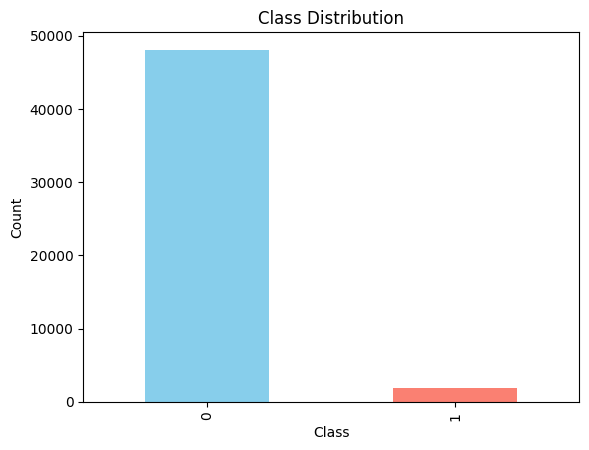

In [57]:
import matplotlib.pyplot as plt

class_distribution.plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()


### Downsampling - reduces the number of samples in the majority class

c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


345/345 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


345/345 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


344/344 [==============================] - 2s 3ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


265/265 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


266/266 [==============================] - 1s 3ms/step


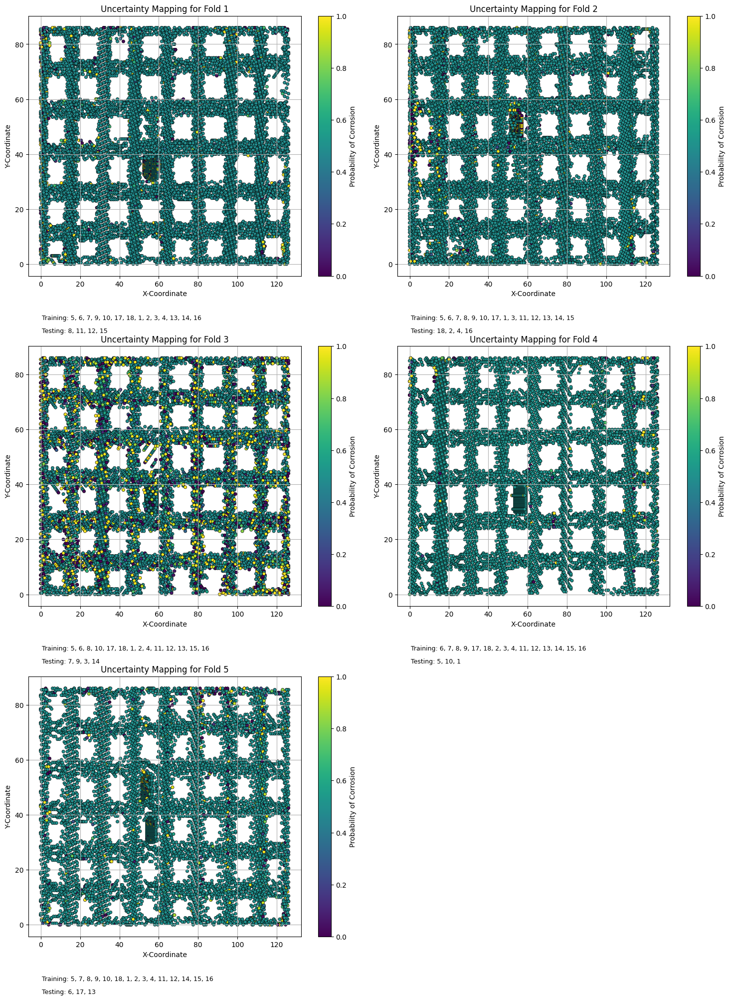

In [58]:


n_splits = 5
group_kfold = GroupKFold(n_splits=n_splits)

# Define the optimizer and loss for the BNN
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.01)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# Lists to store performance metrics for each fold
all_accuracies = []
all_precisions = []
all_recalls = []
all_f1_scores = []
all_prob_corrosions = []
all_x_coords = []
all_y_coords = []
train_experiments = []  # To store the training experiments for each fold
test_experiments = []  # To store the testing experiments for each fold



# Loop through each fold, train the model, make predictions, compute metrics, and plot
for i, (train_index, test_index) in enumerate(group_kfold.split(X, y, groups)):
    # Split data
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Store the unique experiment numbers for training and testing in this fold
    train_experiments.append(groups.iloc[train_index].unique())
    test_experiments.append(groups.iloc[test_index].unique())
    
    # Downsampling
    combined = pd.concat([X_train_fold, y_train_fold], axis=1)
    corrosion = combined[combined.Label==1]
    no_corrosion = combined[combined.Label==0]

    # Downsampling the majority class
    no_corrosion_downsampled = resample(no_corrosion,
                                        replace=False,
                                        n_samples=len(corrosion),
                                        random_state=42)
    
    # Combine minority and downsampled majority class
    downsampled = pd.concat([no_corrosion_downsampled, corrosion])

    X_train_fold = downsampled.drop('Label', axis=1)
    y_train_fold = downsampled['Label']


    # Build and compile the BNN
    bnn_model = build_bnn_model((7,))
    bnn_model.build((None, 7))  # Build the model with the input shape
    bnn_model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
    
    # Train the BNN
    bnn_model.fit(X_train_fold, y_train_fold, epochs=50, batch_size=32, verbose=0)

    # Predictions
    predicted_probs_fold = bnn_model.predict(X_test_fold)
    predicted_labels_fold = tf.argmax(predicted_probs_fold, axis=1).numpy()

    # Store performance metrics
    accuracy = accuracy_score(y_test_fold, predicted_labels_fold)
    precision = precision_score(y_test_fold, predicted_labels_fold)
    recall = recall_score(y_test_fold, predicted_labels_fold)
    f1 = f1_score(y_test_fold, predicted_labels_fold)

    all_accuracies.append(accuracy)
    all_precisions.append(precision)
    all_recalls.append(recall)
    all_f1_scores.append(f1)
    all_prob_corrosions.append(predicted_probs_fold[:, 1])
    all_x_coords.append(corrosion_data.iloc[test_index]['X-Coordinate'].values)
    all_y_coords.append(corrosion_data.iloc[test_index]['Y-Coordinate'].values)

# Return the mean of the performance metrics over all folds for validation
mean_accuracy = np.mean(all_accuracies)
mean_precision = np.mean(all_precisions)
mean_recall = np.mean(all_recalls)
mean_f1 = np.mean(all_f1_scores)

mean_accuracy, mean_precision, mean_recall, mean_f1

# Plotting the uncertainty with repositioned labels
plt.figure(figsize=(15, 20))
for i in range(n_splits):
    plt.subplot(3, 2, i+1)
    sc = plt.scatter(all_x_coords[i], all_y_coords[i], c=all_prob_corrosions[i], cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
    plt.colorbar(sc, label='Probability of Corrosion')
    plt.xlabel('X-Coordinate')
    plt.ylabel('Y-Coordinate')
    plt.title(f'Uncertainty Mapping for Fold {i+1}')
    
    # Adding the label with training and testing experiments
    train_exp_text = "Training: " + ", ".join(map(str, train_experiments[i]))
    test_exp_text = "Testing: " + ", ".join(map(str, test_experiments[i]))
    
    # Repositioning the text below the x-axis
    plt.text(0.05, -0.15, train_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    plt.text(0.05, -0.20, test_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    
    plt.grid(True)

plt.tight_layout()
plt.show()



In [59]:
mean_accuracy, mean_precision, mean_recall, mean_f1

(0.7361223105168104,
 0.09785218193651471,
 0.33200549921714456,
 0.12213902127637984)

### Oversampling - by replicating instances of the minority class.

c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


345/345 [==============================] - 1s 3ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


345/345 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


344/344 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


265/265 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


266/266 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


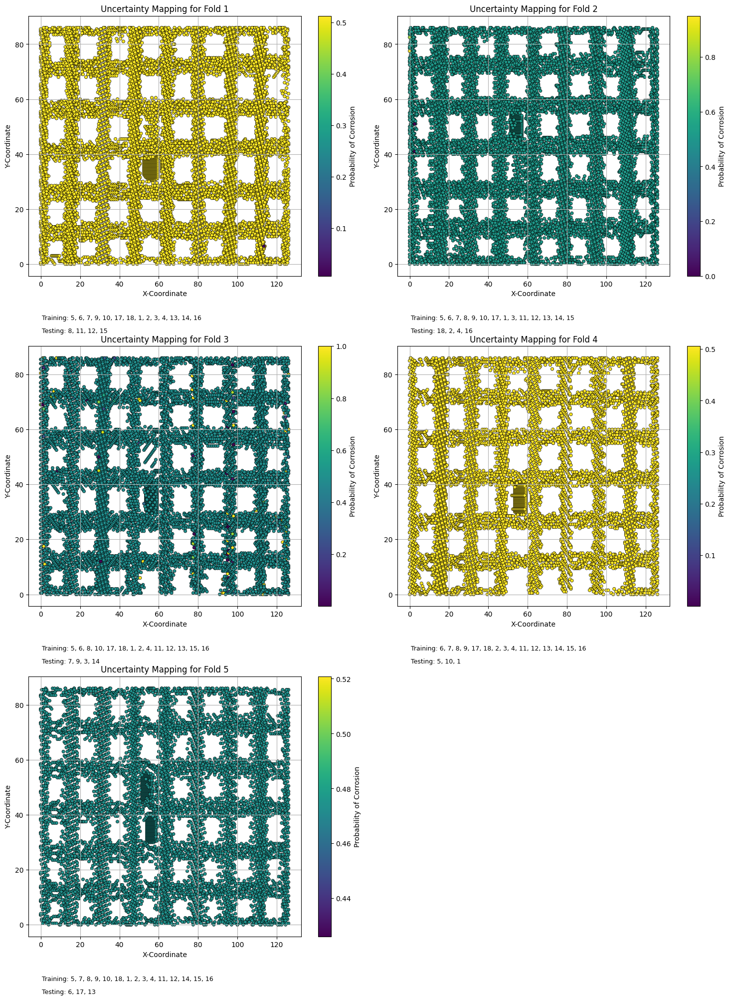

In [60]:


n_splits = 5
group_kfold = GroupKFold(n_splits=n_splits)

# Define the optimizer and loss for the BNN
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.01)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# Lists to store performance metrics for each fold
all_accuracies = []
all_precisions = []
all_recalls = []
all_f1_scores = []
all_prob_corrosions = []
all_x_coords = []
all_y_coords = []
train_experiments = []  # To store the training experiments for each fold
test_experiments = []  # To store the testing experiments for each fold



# Loop through each fold, train the model, make predictions, compute metrics, and plot
for i, (train_index, test_index) in enumerate(group_kfold.split(X, y, groups)):
    # Split data
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Store the unique experiment numbers for training and testing in this fold
    train_experiments.append(groups.iloc[train_index].unique())
    test_experiments.append(groups.iloc[test_index].unique())
    
    # Oversampling
    combined = pd.concat([X_train_fold, y_train_fold], axis=1)
    corrosion = combined[combined.Label==1]
    no_corrosion = combined[combined.Label==0]

    # Oversampling the minority class
    corrosion_oversampled = resample(corrosion,
                                     replace=True,
                                     n_samples=len(no_corrosion),
                                     random_state=42)
    
    # Combine majority and oversampled minority class
    oversampled = pd.concat([no_corrosion, corrosion_oversampled])

    X_train_fold = oversampled.drop('Label', axis=1)
    y_train_fold = oversampled['Label']


    # Build and compile the BNN
    bnn_model = build_bnn_model((7,))
    bnn_model.build((None, 7))  # Build the model with the input shape
    bnn_model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
    
    # Train the BNN
    bnn_model.fit(X_train_fold, y_train_fold, epochs=50, batch_size=32, verbose=0)

    # Predictions
    predicted_probs_fold = bnn_model.predict(X_test_fold)
    predicted_labels_fold = tf.argmax(predicted_probs_fold, axis=1).numpy()

    # Store performance metrics
    accuracy = accuracy_score(y_test_fold, predicted_labels_fold)
    precision = precision_score(y_test_fold, predicted_labels_fold)
    recall = recall_score(y_test_fold, predicted_labels_fold)
    f1 = f1_score(y_test_fold, predicted_labels_fold)

    all_accuracies.append(accuracy)
    all_precisions.append(precision)
    all_recalls.append(recall)
    all_f1_scores.append(f1)
    all_prob_corrosions.append(predicted_probs_fold[:, 1])
    all_x_coords.append(corrosion_data.iloc[test_index]['X-Coordinate'].values)
    all_y_coords.append(corrosion_data.iloc[test_index]['Y-Coordinate'].values)

# Return the mean of the performance metrics over all folds for validation
mean_accuracy = np.mean(all_accuracies)
mean_precision = np.mean(all_precisions)
mean_recall = np.mean(all_recalls)
mean_f1 = np.mean(all_f1_scores)

mean_accuracy, mean_precision, mean_recall, mean_f1

# Plotting the uncertainty with repositioned labels
plt.figure(figsize=(15, 20))
for i in range(n_splits):
    plt.subplot(3, 2, i+1)
    sc = plt.scatter(all_x_coords[i], all_y_coords[i], c=all_prob_corrosions[i], cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
    plt.colorbar(sc, label='Probability of Corrosion')
    plt.xlabel('X-Coordinate')
    plt.ylabel('Y-Coordinate')
    plt.title(f'Uncertainty Mapping for Fold {i+1}')
    
    # Adding the label with training and testing experiments
    train_exp_text = "Training: " + ", ".join(map(str, train_experiments[i]))
    test_exp_text = "Testing: " + ", ".join(map(str, test_experiments[i]))
    
    # Repositioning the text below the x-axis
    plt.text(0.05, -0.15, train_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    plt.text(0.05, -0.20, test_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    
    plt.grid(True)

plt.tight_layout()
plt.show()



In [61]:
mean_accuracy, mean_precision, mean_recall, mean_f1

(0.40036055240903445, 0.020939363420291728, 0.6, 0.04028224705971599)

### Oversampling - SMOTE
- SMOTE works by generating synthetic samples in the feature space. These synthetic samples are generated for the minority class. After applying SMOTE, the dataset will have a balanced distribution.

c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


345/345 [==============================] - 1s 3ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


345/345 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


344/344 [==============================] - 2s 3ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


265/265 [==============================] - 1s 2ms/step


c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\tensorflow_probability\python\layers\util.py:98: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use the `layer.add_weight()` method instead.
  loc = add_variable_fn(
c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\keras\src\backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


266/266 [==============================] - 2s 4ms/step


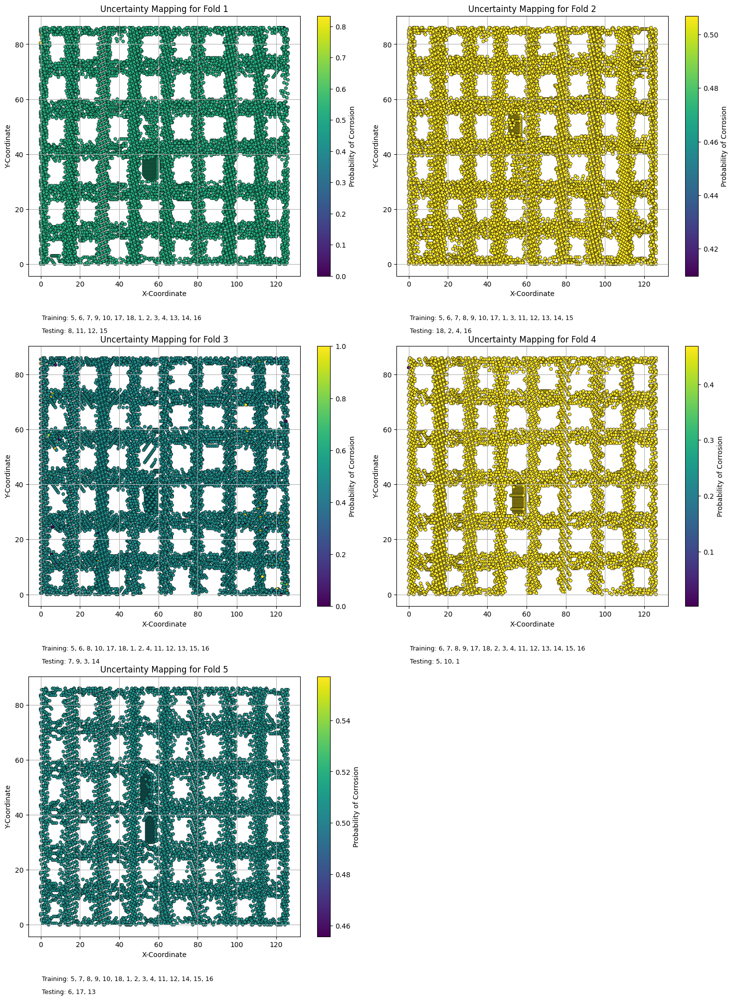

In [62]:
from imblearn.over_sampling import SMOTE


n_splits = 5
group_kfold = GroupKFold(n_splits=n_splits)

# Define the optimizer and loss for the BNN
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.01)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# Lists to store performance metrics for each fold
all_accuracies = []
all_precisions = []
all_recalls = []
all_f1_scores = []
all_prob_corrosions = []
all_x_coords = []
all_y_coords = []
train_experiments = []  # To store the training experiments for each fold
test_experiments = []  # To store the testing experiments for each fold




smote = SMOTE(random_state=42)

for i, (train_index, test_index) in enumerate(group_kfold.split(X, y, groups)):
    # Split data
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Store the unique experiment numbers for training and testing in this fold
    train_experiments.append(groups.iloc[train_index].unique())
    test_experiments.append(groups.iloc[test_index].unique())
    
    # Apply SMOTE
    X_train_fold, y_train_fold = smote.fit_resample(X_train_fold, y_train_fold)



    # Build and compile the BNN
    bnn_model = build_bnn_model((7,))
    bnn_model.build((None, 7))  # Build the model with the input shape
    bnn_model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
    
    # Train the BNN
    bnn_model.fit(X_train_fold, y_train_fold, epochs=50, batch_size=32, verbose=0)

    # Predictions
    predicted_probs_fold = bnn_model.predict(X_test_fold)
    predicted_labels_fold = tf.argmax(predicted_probs_fold, axis=1).numpy()

    # Store performance metrics
    accuracy = accuracy_score(y_test_fold, predicted_labels_fold)
    precision = precision_score(y_test_fold, predicted_labels_fold)
    recall = recall_score(y_test_fold, predicted_labels_fold)
    f1 = f1_score(y_test_fold, predicted_labels_fold)

    all_accuracies.append(accuracy)
    all_precisions.append(precision)
    all_recalls.append(recall)
    all_f1_scores.append(f1)
    all_prob_corrosions.append(predicted_probs_fold[:, 1])
    all_x_coords.append(corrosion_data.iloc[test_index]['X-Coordinate'].values)
    all_y_coords.append(corrosion_data.iloc[test_index]['Y-Coordinate'].values)

# Return the mean of the performance metrics over all folds for validation
mean_accuracy = np.mean(all_accuracies)
mean_precision = np.mean(all_precisions)
mean_recall = np.mean(all_recalls)
mean_f1 = np.mean(all_f1_scores)

mean_accuracy, mean_precision, mean_recall, mean_f1

# Plotting the uncertainty with repositioned labels
plt.figure(figsize=(15, 20))
for i in range(n_splits):
    plt.subplot(3, 2, i+1)
    sc = plt.scatter(all_x_coords[i], all_y_coords[i], c=all_prob_corrosions[i], cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
    plt.colorbar(sc, label='Probability of Corrosion')
    plt.xlabel('X-Coordinate')
    plt.ylabel('Y-Coordinate')
    plt.title(f'Uncertainty Mapping for Fold {i+1}')
    
    # Adding the label with training and testing experiments
    train_exp_text = "Training: " + ", ".join(map(str, train_experiments[i]))
    test_exp_text = "Testing: " + ", ".join(map(str, test_experiments[i]))
    
    # Repositioning the text below the x-axis
    plt.text(0.05, -0.15, train_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    plt.text(0.05, -0.20, test_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    
    plt.grid(True)

plt.tight_layout()
plt.show()



In [63]:
mean_accuracy, mean_precision, mean_recall, mean_f1

(0.4004277474537819,
 0.020944690286737074,
 0.599203187250996,
 0.04028886908342714)